In [1]:
import warnings
from itertools import cycle

import plotly.express as px
from pyspark.sql import Column, DataFrame, SparkSession
from pyspark.sql import functions as F
from pyspark.sql.types import TimestampType

warnings.filterwarnings("ignore")

spark = (
    SparkSession.builder.config("spark.sql.warehouse.dir", "../hive/spark-warehouse")
    .config("spark.driver.extraJavaOptions", "-Dderby.system.home='../hive'")
    .enableHiveSupport()
    .getOrCreate()
)

Using Spark's default log4j profile: org/apache/spark/log4j-defaults.properties
Setting default log level to "WARN".
To adjust logging level use sc.setLogLevel(newLevel). For SparkR, use setLogLevel(newLevel).
23/10/17 08:50:26 WARN NativeCodeLoader: Unable to load native-hadoop library for your platform... using builtin-java classes where applicable


In [22]:
df_raw = spark.read.parquet("../sample_data/telemetry-data.parquet")
df_raw.count()

2564156

In [3]:
df_trips = spark.table("trips")
df_trips

23/10/17 08:50:35 WARN HiveConf: HiveConf of name hive.stats.jdbc.timeout does not exist
23/10/17 08:50:35 WARN HiveConf: HiveConf of name hive.stats.retries.wait does not exist
23/10/17 08:50:38 WARN ObjectStore: Version information not found in metastore. hive.metastore.schema.verification is not enabled so recording the schema version 2.3.0
23/10/17 08:50:38 WARN ObjectStore: setMetaStoreSchemaVersion called but recording version is disabled: version = 2.3.0, comment = Set by MetaStore filipbec@192.168.0.186


DataFrame[metadata_pvin: string, trip_id: string, trip_start_ts: timestamp, trip_end_ts: timestamp]

In [4]:
def get_signal_data(df: DataFrame, signal_name: str) -> DataFrame:
    return df.filter(F.col("signaldata_signalname") == signal_name)


def ms_to_timestamp(col_name: str) -> Column:
    return (F.col(col_name) / 1000).cast(TimestampType())

In [14]:
def get_pandas_data_for_pvin(pvin: str = "828ea4a8e2ab1840f4eed3747749c780"):
    df = df_raw.filter(F.col("metadata_pvin") == pvin)

    df_speed = get_signal_data(df, "KBI_angez_Geschw_K2CAN")
    df_speed = df_speed.filter(F.col("signaldata_interpretedvalue_asdoublevalue") > 0)

    df_acc = get_signal_data(df, "SARA_Accel_X_r")
    df_acc = df_acc.filter(F.col("signaldata_interpretedvalue_asdoublevalue") != 0)

    df = df_speed.union(df_acc)

    # # convert timestamp to appropriate type
    df = df.withColumn("signal_ts", ms_to_timestamp("signaldata_timeofoccurrence"))
    df = df.select(
        F.col("metadata_pvin").alias("pvin"),
        F.col("signaldata_signalname").alias("signal_name"),
        F.col("signaldata_interpretedvalue_asdoublevalue").alias("signal_value"),
        "signal_ts",
    )

    return df.toPandas()


get_pandas_data_for_pvin().head(5)

,pvin,signal_name,signal_value,signal_ts
0,828ea4a8e2ab1840f4eed3747749c780,KBI_angez_Geschw_K2CAN,63.04,2022-10-01 14:51:07.147
1,828ea4a8e2ab1840f4eed3747749c780,KBI_angez_Geschw_K2CAN,59.84,2022-10-01 14:51:08.147
2,828ea4a8e2ab1840f4eed3747749c780,KBI_angez_Geschw_K2CAN,61.44,2022-10-01 14:51:09.147
3,828ea4a8e2ab1840f4eed3747749c780,KBI_angez_Geschw_K2CAN,68.16,2022-10-01 14:51:10.147
4,828ea4a8e2ab1840f4eed3747749c780,KBI_angez_Geschw_K2CAN,76.80,2022-10-01 14:51:11.147


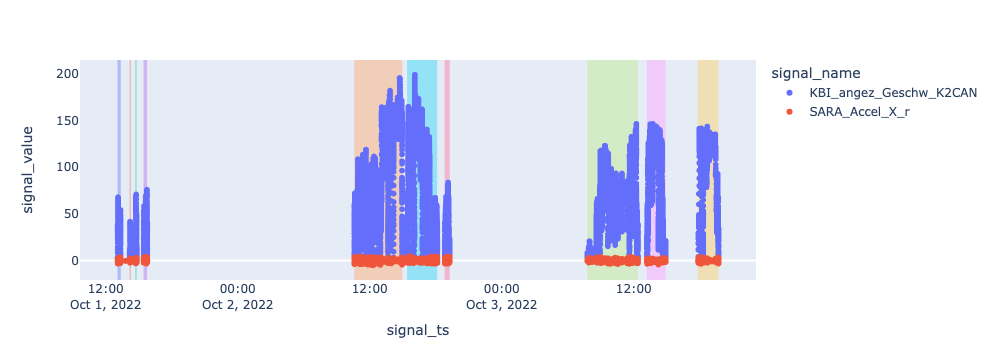

In [21]:
# PVINs
# 828ea4a8e2ab1840f4eed3747749c780
# 9ff935a086171b54f99b922eead44035
# 05a9199f7cf22ceffa579b149b403586

PVIN = "9ff935a086171b54f99b922eead44035"

pd_df_raw = get_pandas_data_for_pvin(PVIN)
pd_df_trips = df_trips.filter(F.col("metadata_pvin") == PVIN).toPandas()

fig = px.scatter(
    pd_df_raw,
    x="signal_ts",
    y="signal_value",
    color="signal_name",
)

palette = cycle(px.colors.qualitative.Plotly)

for item in pd_df_trips.iterrows():
    fig.add_vrect(
        x0=item[1]["trip_start_ts"],
        x1=item[1]["trip_end_ts"],
        fillcolor=next(palette),
        opacity=0.4,
        layer="below",
        line_width=0,
    )

fig.update_layout(
    xaxis=dict(showgrid=False),
    yaxis=dict(showgrid=False),
)

fig